In [1]:
import sys

sys.path.append("..")
from src import *

/home/vmorelli-iit.local/Projects/freq2clean/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Cupy Available= 1


# [Mouse Neuronal Populations ($100\mu m$)](https://zenodo.org/records/6299096)
This dataset comes from the training and validation open resources of *DeepCAD-RT*. 

Please download and extract it into `dataset/zenodo/mouse_neuronal_populations` using:

In [ ]:
meta = DATASETS["mouse_neuronal_populations"]
meta.download()

In [ ]:
x = Recording(meta.x)
gt = Recording(meta.gt)
gt_deepcad = Recording(meta.gt.with_name("gt_deepcad.tif"))

In [4]:
x.np.shape

(6500, 490, 490)

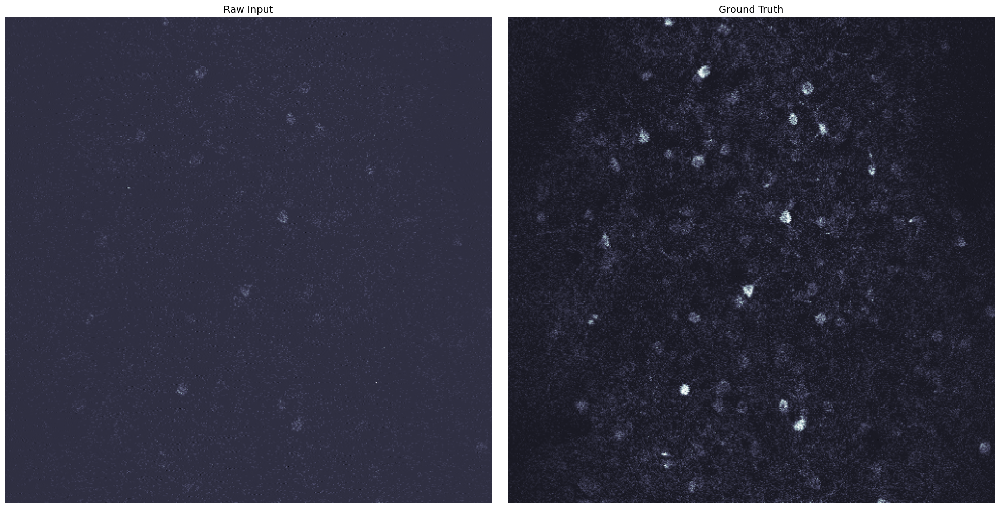

In [9]:
imshow({"Raw Input": x.np[-1], "Ground Truth": gt.np[-1]}, size=10, cmap="bone")

## Averaging window test

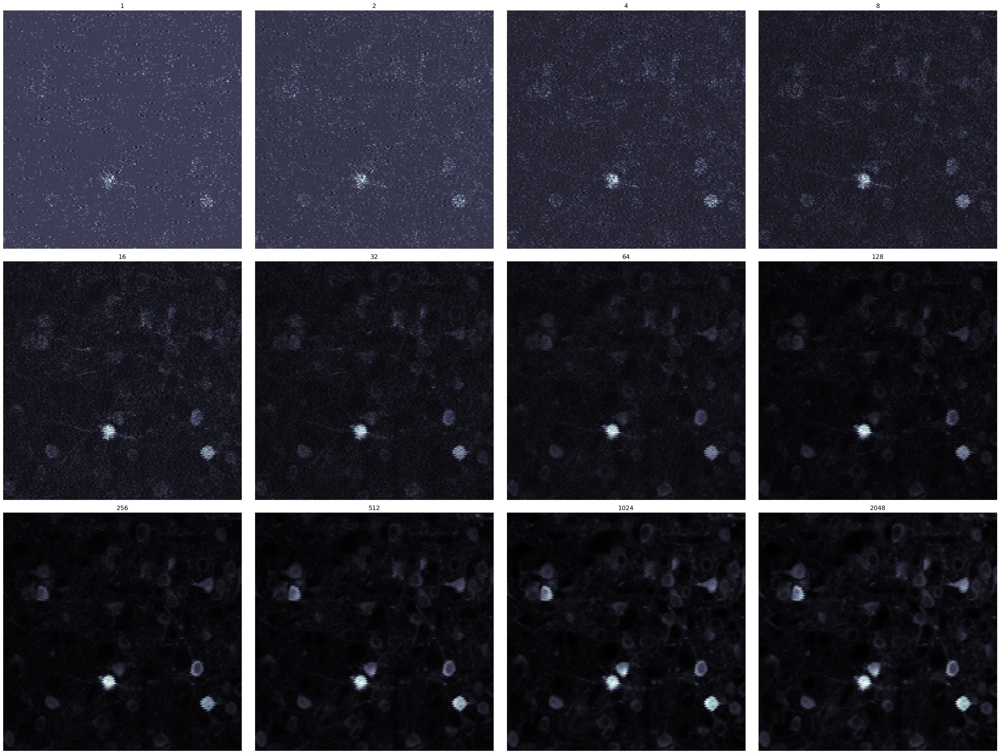

In [28]:
imshow({2**i: x.avg_frame(x.frames // 2, 2**i) for i in range(12)}, size=8, cols=4, zoom=2.5, cmap="bone")

Given the modest input SNR, a Window with size $128$ is enough to deliver satisfactory frames.

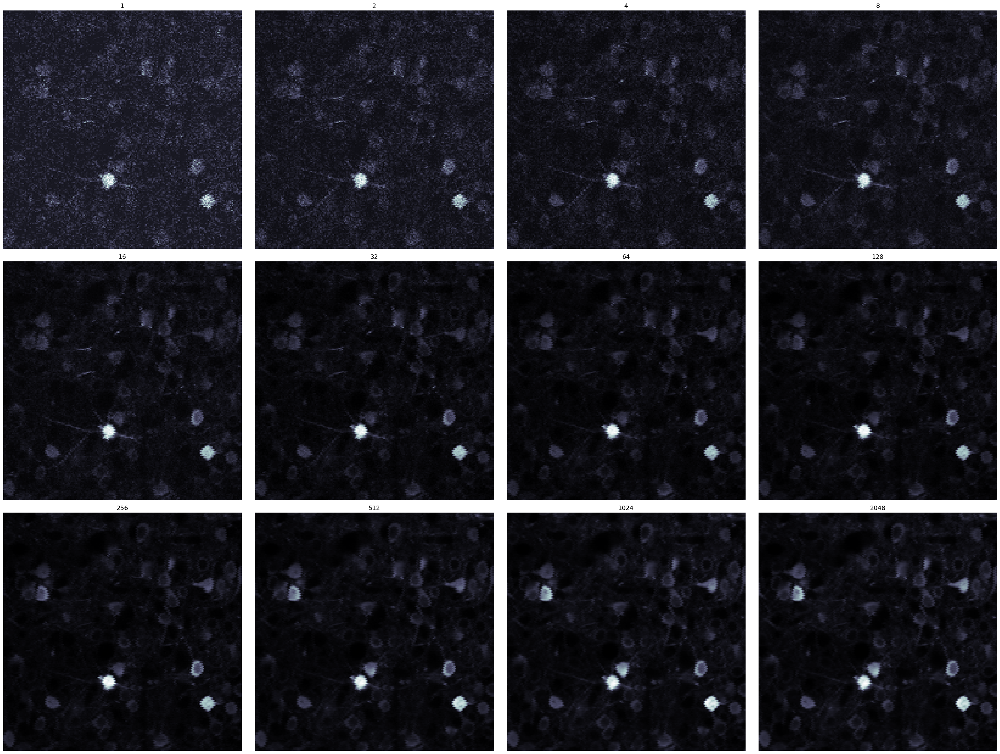

In [29]:
imshow({2**i: gt.avg_frame(x.frames // 2, 2**i) for i in range(12)}, size=8, cols=4, zoom=2.5, cmap="bone")

## $DeepCAD(Ground Truth) may be our Ground Truth?$
Long story short: no. Even on the ground truth, fine details are harmed by DeepCAD. Therefore, Freq2Clean wouldn't register a PSNR/SSIM improvement.

In [ ]:
y = Recording(meta.gt.with_name("deepcad_15.tif"))

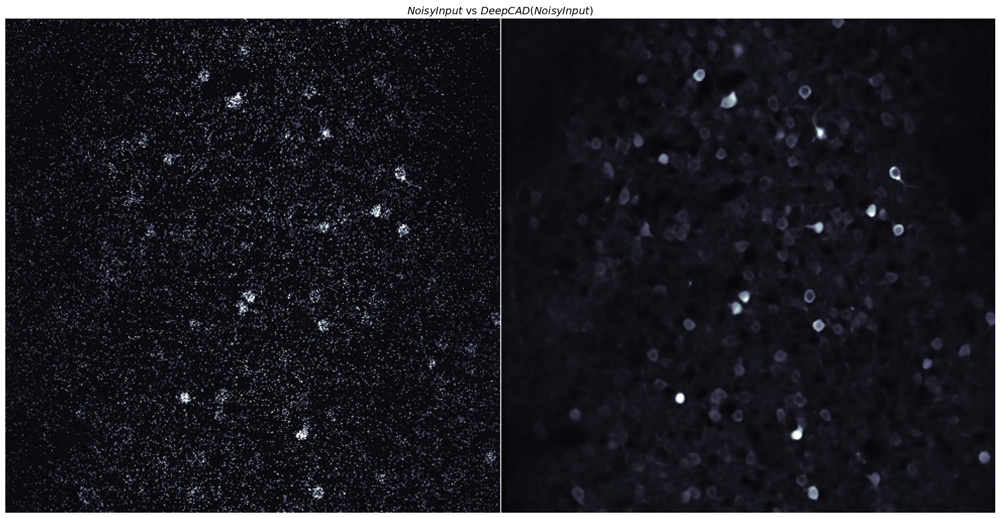

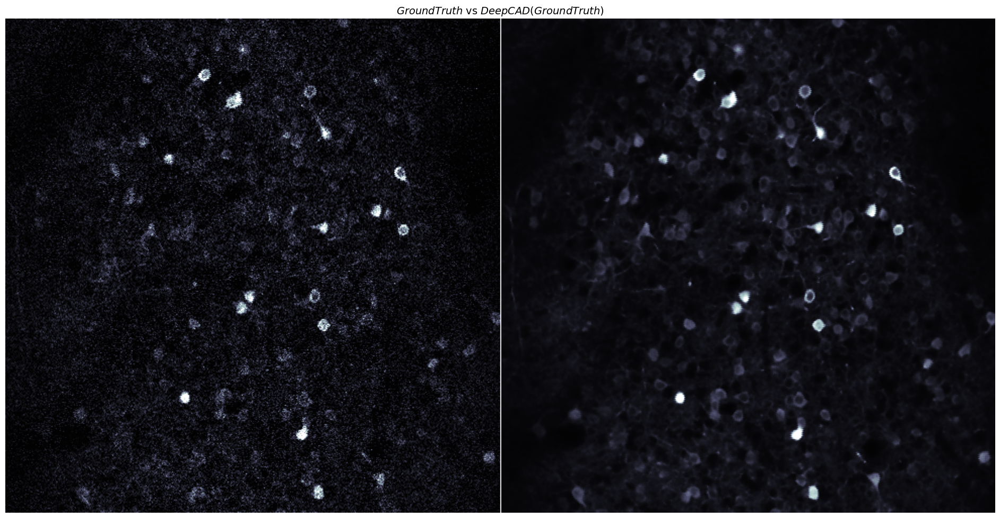

In [93]:
i = random.randrange(6000)
from csbdeep.utils import normalize


cat = np.concatenate([x.np[i], y.np[i]], axis=1)
cat[:, cat.shape[1] // 2] = np.max(cat)
imshow({"$Noisy Input$ vs $DeepCAD(Noisy Input)$":normalize(cat)}, size=20, zoom=1, cmap="bone", vrange=(0, 1))

cat = np.concatenate([gt.np[i], gt_deepcad.np[i]], axis=1)
cat[:, cat.shape[1] // 2] = np.max(cat)
imshow({"$Ground Truth$ vs $DeepCAD(Ground Truth)$":normalize(cat)}, size=20, zoom=1, cmap="bone", vrange=(0, 1))

## Data distribution

<Axes: >

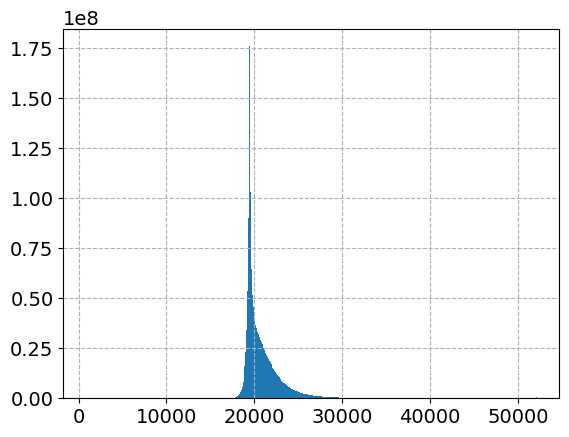

In [25]:
pd.Series(gt.np.ravel()).hist(bins=500)

In [26]:
np.quantile(gt.np, 0.999)

np.float64(47939.0)